In [187]:
import transbigdata as tbd
import pandas as pd
import CoordinatesConverter

data = pd.read_csv("C:\\Users\\Xu\\Desktop\\pycharm\\data\\traj.csv",low_memory=False)
data.columns = ['id','time','entity_id','traj_id','coordinates','current_dis','speeds','holidays']
data.head()

,id,time,entity_id,traj_id,coordinates,current_dis,speeds,holidays
0,0,2013-10-08T17:45:00Z,254,0,"[116.318726,40.009014]",0.000000,36.6900,0
1,1,2013-10-08T17:46:45Z,254,0,"[116.315102,40.004784]",0.562623,24.5375,0
2,2,2013-10-08T17:47:39Z,254,0,"[116.315018,40.002842]",0.778695,31.9675,0
3,3,2013-10-08T17:49:26Z,254,0,"[116.315041,39.998585]",1.252148,19.7850,0
4,4,2013-10-08T17:51:15Z,254,0,"[116.315605,39.992554]",1.924533,24.4500,0


最小经度: 116.2500662
最大经度: 116.5018476
最小纬度: 39.7955236
最大纬度: 40.0006224


<Axes: >

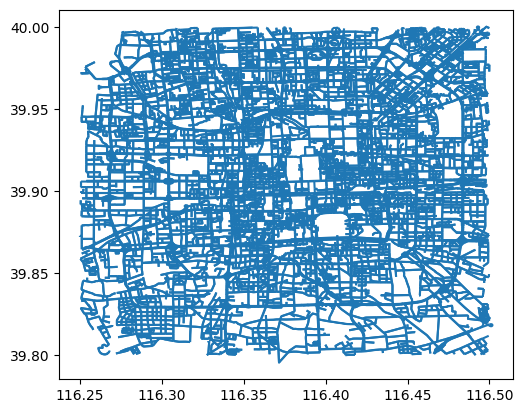

In [188]:
import geopandas as gpd

sz = gpd.read_file("C:\\Users\\Xu\\Desktop\\pycharm\\data\\roads_shapefile.shp")
# 获取边界
bounds = sz.total_bounds
min_longitude, min_latitude, max_longitude, max_latitude = bounds

# 打印经纬度极值
print("最小经度:", min_longitude)
print("最大经度:", max_longitude)
print("最小纬度:", min_latitude)
print("最大纬度:", max_latitude)

sz.plot()

In [221]:
bounds = [116.197922,39.759785,116.548103,40.025291]

params = tbd.area_to_params(bounds,accuracy=30)
params


{'slon': 116.197922,
 'slat': 39.759785,
 'deltalon': 0.00035164128333345395,
 'deltalat': 0.0002697963123853744,
 'theta': 0,
 'method': 'rect',
 'gridsize': 30}

<Axes: >

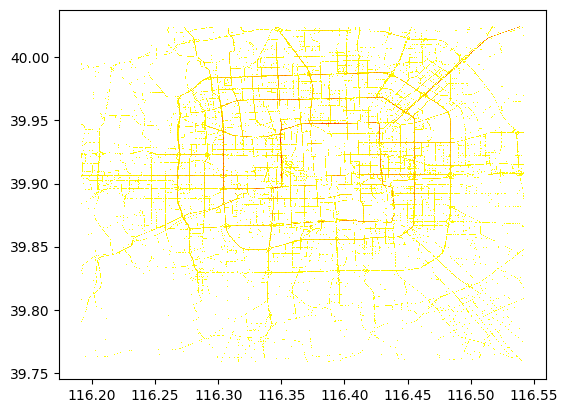

In [222]:
file_path = "C:\\Users\\Xu\\Desktop\\pycharm\\data\\traj.csv"
data = pd.read_csv(file_path, low_memory=False)

# 分解 'coordinates' 列为 'latitude' 和 'longitude'
data[['longitude', 'latitude']] = data['coordinates'].str.strip('[]').str.split(',', expand=True).astype(float)
data['longitude'],data['latitude'] = CoordinatesConverter.gcj02towgs84(data['longitude'],data['latitude'])
data['LONCOL'],data['LATCOL'] = tbd.GPS_to_grid(data['longitude'],data['latitude'],params)


# 聚合集计栅格内数据量
grid_agg=data.groupby(['LONCOL','LATCOL'])['entity_id'].count().reset_index()

# 生成栅格的几何图形
grid_agg['geometry']=tbd.grid_to_polygon([grid_agg['LONCOL'],grid_agg['LATCOL']],params)

# 转换为GeoDataFrame
grid_agg=gpd.GeoDataFrame(grid_agg)

# 绘制栅格
grid_agg.plot(column = 'entity_id',cmap = 'autumn_r')

In [239]:
import matplotlib.pyplot as plt

fig =plt.figure(1,(15,15),dpi=800)
ax =plt.subplot(111)
plt.sca(ax)

# 添加行政区划边界作为底图
sz.plot(ax=ax,edgecolor=(0,0,0,0.6),facecolor=(0,0,0,0),linewidths=0.8,zorder = 1)

# 定义色条位置
cax = plt.axes([0.04, 0.33, 0.02, 0.3])
plt.title('Data count')
plt.sca(ax)

# 绘制数据
grid_agg.plot(column = 'entity_id',cmap = 'autumn_r',alpha = 0.7,ax = ax,cax = cax,legend = True,zorder = 2)

# 添加指北针和比例尺
tbd.plotscale(ax,bounds = bounds,textsize = 10,compasssize = 1,accuracy = 500,rect = [0.06,0.03],zorder = 10)
plt.axis('off')
plt.xlim(bounds[0],bounds[2])
plt.ylim(bounds[1],bounds[3])
plt.show()

In [192]:
file_path = "C:\\Users\\Xu\\Desktop\\pycharm\\data\\traj.csv"
data = pd.read_csv(file_path, low_memory=False)
data[['longitude', 'latitude']] = data['coordinates'].str.strip('[]').str.split(',', expand=True).astype(float)
data['longitude'],data['latitude'] = CoordinatesConverter.gcj02towgs84(data['longitude'],data['latitude'])
data['LONCOL'],data['LATCOL'] = tbd.GPS_to_grid(data['longitude'],data['latitude'],params)

# 根据 traj_id 生成新的一列 OpenStatus，对于每个 traj_id 的第一行设置为 1，其余设置为 0
data['OpenStatus'] = data.groupby('traj_id').cumcount().eq(0).astype(int)

# 查看修改后的数据的前几行
data

,id,time,entity_id,traj_id,coordinates,current_dis,speeds,holidays,longitude,latitude,LONCOL,LATCOL,OpenStatus
0,0,2013-10-08T17:45:00Z,254,0,"[116.318726,40.009014]",0.000000,36.6900,0,116.312600,40.007716,489,1378,1
1,1,2013-10-08T17:46:45Z,254,0,"[116.315102,40.004784]",0.562623,24.5375,0,116.308985,40.003493,474,1355,0
2,2,2013-10-08T17:47:39Z,254,0,"[116.315018,40.002842]",0.778695,31.9675,0,116.308901,40.001551,473,1344,0
3,3,2013-10-08T17:49:26Z,254,0,"[116.315041,39.998585]",1.252148,19.7850,0,116.308925,39.997295,474,1320,0
4,4,2013-10-08T17:51:15Z,254,0,"[116.315605,39.992554]",1.924533,24.4500,0,116.309488,39.991263,476,1287,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
414839,518403,2013-10-30T23:14:35Z,4954,21998,"[116.333366,39.79073]",21.419211,27.1450,0,116.327235,39.789416,552,165,0
414840,518404,2013-10-30T23:14:59Z,4954,21998,"[116.330444,39.79084]",21.669183,30.0825,0,116.324319,39.789531,539,165,0
414841,518405,2013-10-30T23:16:35Z,4954,21998,"[116.328453,39.793888]",22.129037,46.0550,0,116.322332,39.792583,531,182,0
414842,518406,2013-10-30T23:16:59Z,4954,21998,"[116.328072,39.796574]",22.429494,51.5150,0,116.321952,39.795269,529,197,0


In [193]:
oddat = tbd.taxigps_to_od(data,col = ['entity_id','time','longitude','latitude','OpenStatus'])
oddat

,entity_id,stime,slon,slat,etime,elon,elat,ID
21,254,2013-10-08T18:45:00Z,116.350153,39.947087,2013-10-08T18:45:54Z,116.349101,39.953055,0
26,254,2013-10-08T19:15:00Z,116.328118,39.967767,2013-10-08T19:16:49Z,116.327767,39.974776,1
50,254,2013-10-08T20:00:00Z,116.337714,39.928395,2013-10-08T20:01:47Z,116.337670,39.926389,2
66,254,2013-10-08T20:30:00Z,116.314919,39.904071,2013-10-08T20:30:36Z,116.314966,39.900580,3
79,254,2013-10-08T20:45:00Z,116.344734,39.869887,2013-10-08T20:45:20Z,116.344886,39.876325,4
...,...,...,...,...,...,...,...,...
362076,4967,2013-10-27T17:00:00Z,116.266596,39.879502,2013-10-27T17:00:36Z,116.269211,39.879136,16944
362088,4967,2013-10-27T18:45:00Z,116.289064,39.900206,2013-10-27T18:45:19Z,116.289139,39.902220,16945
362113,4967,2013-10-27T19:15:00Z,116.289016,39.912218,2013-10-27T19:16:00Z,116.289115,39.915819,16946
362131,4967,2013-10-27T19:30:00Z,116.301578,39.934978,2013-10-27T19:31:18Z,116.303794,39.933700,16947


<Axes: >

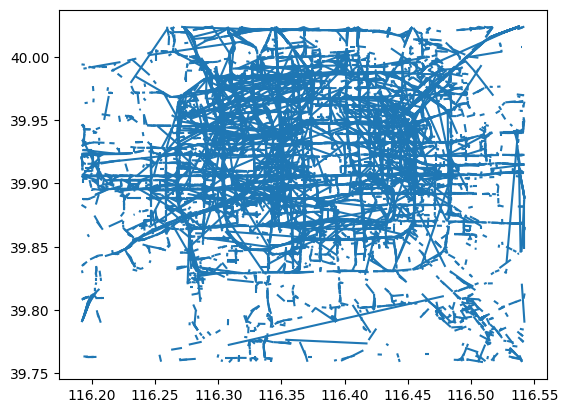

In [212]:
params = tbd.area_to_params(bounds,accuracy=20)
od_gdf = tbd.odagg_grid(oddat,params)
od_gdf.plot()

In [195]:
import CoordinatesConverter
data['longitude'],data['latitude'] = CoordinatesConverter.gcj02towgs84(data['longitude'],data['latitude'])

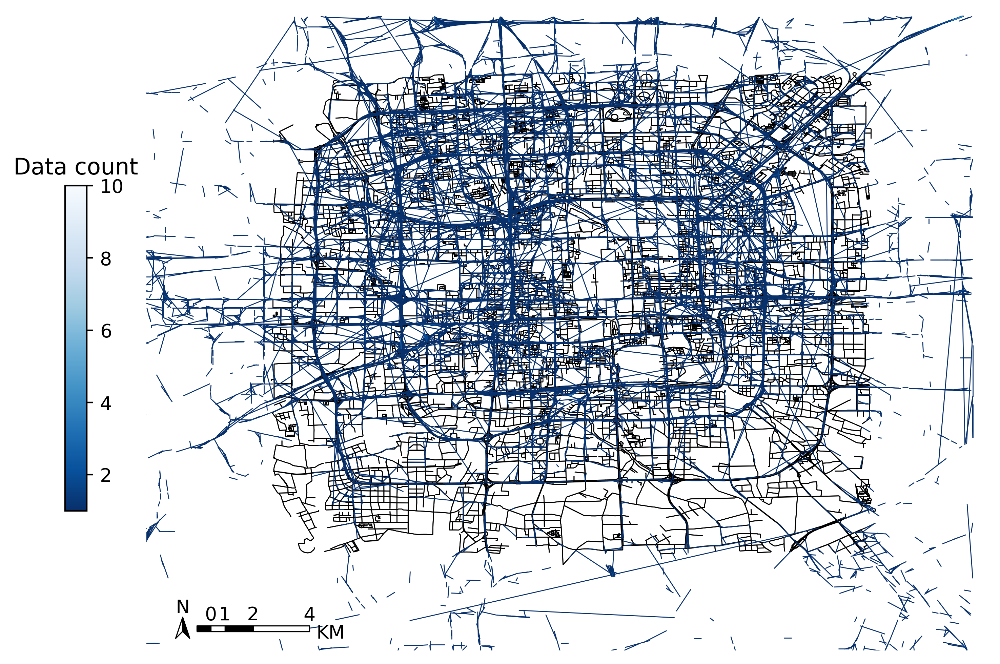

In [210]:
# 创建图框
import matplotlib.pyplot as plt

fig =plt.figure(1,(8,8),dpi=400)
ax =plt.subplot(111)
plt.sca(ax)

# 添加行政区划边界作为底图
sz.plot(ax=ax,edgecolor=(0,0,0,1),facecolor=(0,0,0,0),linewidths=0.5)

# 绘制colorbar
cax=plt.axes([0.05, 0.33, 0.02, 0.3])
plt.title('Data count')
plt.sca(ax)

# 绘制OD
od_gdf.plot(ax = ax,column = 'count',cmap = 'Blues_r',linewidth = 0.5,vmax = 10,cax = cax,legend = True)

# 添加比例尺和指北针
tbd.plotscale(ax,bounds=bounds,textsize=10,compasssize=1,accuracy=500,rect = [0.06,0.03],zorder = 10)
plt.axis('off')
plt.xlim(bounds[0],bounds[2])
plt.ylim(bounds[1],bounds[3])
plt.show()